In [ ]:
# ==============================================================================
#                      CELL 1: INSTALL DEPENDENCIES
# ==============================================================================
%pip install -q openvino scikit-image matplotlib tqdm

print("✅ All necessary libraries have been installed.")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.6/47.6 MB 13.2 MB/s eta 0:00:00
✅ All necessary libraries have been installed.


✅ Libraries loaded.

--- Step 1: Upload your OpenVINO model .zip file ---


Saving openvino_model.zip to openvino_model (2).zip

--- Step 2: Initializing OpenVINO ---
✅ OpenVINO model compiled for CPU and is ready.

--- Step 3: Upload your benchmark dataset .zip file (containing hr and student_lr folders) ---


Saving finaltest_KD.zip to finaltest_KD.zip
Searching for 'hr' and 'student_lr' folders...
✅ Found 86 images. Starting benchmark...


Benchmarking on CPU with OpenVINO:   0%|          | 0/86 [00:00<?, ?it/s]


📊 CPU BENCHMARK (OpenVINO) - NUMERICAL SUMMARY 📊
Average SSIM: 0.8937 (Std Dev: 0.0859)
Average PSNR: 26.89 dB (Std Dev: 2.92)
Average FPS (System Throughput): 0.10 FPS

📈 CPU BENCHMARK (OpenVINO) - GRAPHICAL ANALYSIS 📈


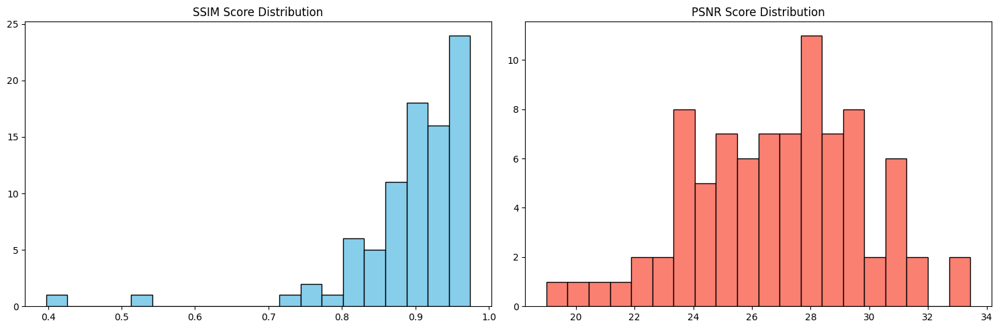

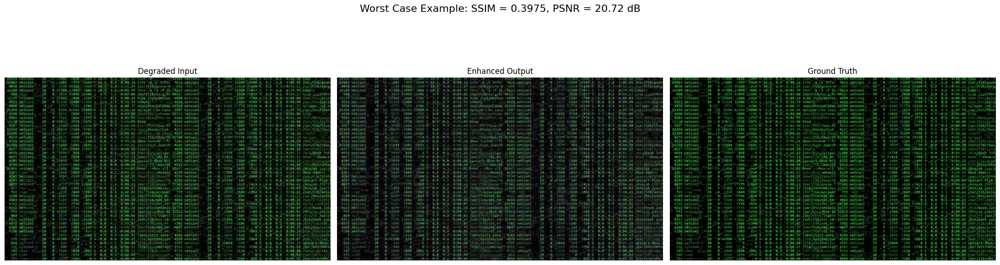

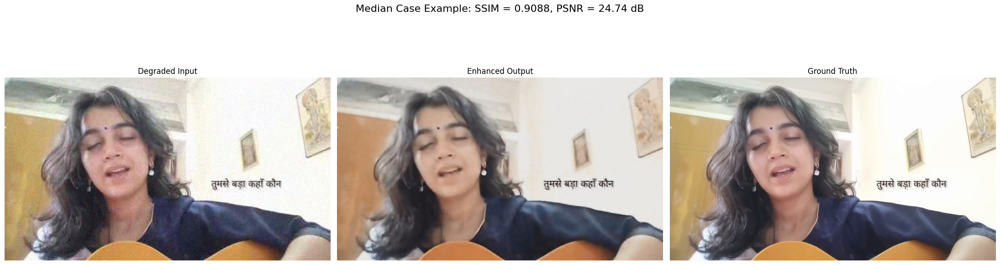

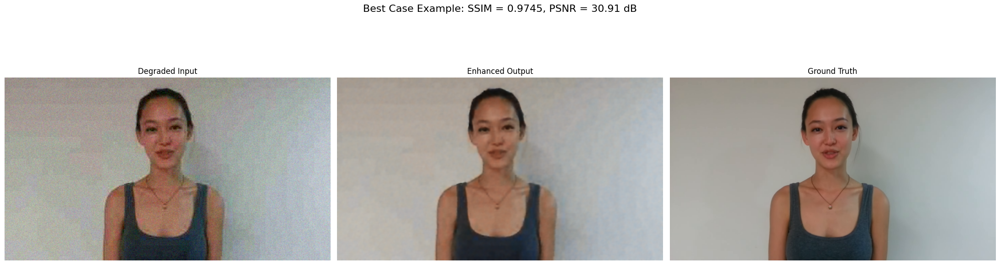


✅ Visual reports saved to '/content/benchmark_outputs/'.


In [ ]:
# ==============================================================================
#      FINAL OPENVINO CPU BENCHMARK SCRIPT (Using Pre-Made HR/LR Pairs)
# ==============================================================================
# This script loads a pre-made validation set (with hr and student_lr folders)
# and runs a comprehensive benchmark on the CPU using an OpenVINO model.
# ==============================================================================

# ------------------------------------------------------------------------------
# 1. SETUP & IMPORTS
# ------------------------------------------------------------------------------
import os
import time
import random
import io
import zipfile
from glob import glob

import cv2
import numpy as np
from PIL import Image
from openvino.runtime import Core
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from google.colab import files

try:
    from skimage.metrics import structural_similarity as ssim
    from skimage.metrics import peak_signal_noise_ratio as psnr
except ImportError:
    print("❌ ERROR: scikit-image is not installed. Please run the installation cell again.")
    exit()

print("✅ Libraries loaded.")

# ------------------------------------------------------------------------------
# 2. CONFIGURATION
# ------------------------------------------------------------------------------
OUTPUT_DIR = '/content/benchmark_outputs/'
os.makedirs(OUTPUT_DIR, exist_ok=True)

# ------------------------------------------------------------------------------
# 3. HELPER FUNCTIONS
# ------------------------------------------------------------------------------
def run_inference_ov(compiled_model, input_pil):
    input_image_np = np.array(input_pil)
    input_image_normalized = input_image_np.astype(np.float32) / 255.0
    input_tensor = np.expand_dims(input_image_normalized.transpose(2, 0, 1), 0)
    output_layer = compiled_model.output(0)
    results = compiled_model([input_tensor])[output_layer]
    output_squeezed = np.squeeze(results)
    output_renormalized = output_squeezed * 255.0
    output_np = np.clip(output_renormalized, 0, 255).astype(np.uint8).transpose(1, 2, 0)
    return Image.fromarray(output_np)

def display_benchmark_report(title, results_data, total_time):
    # (This function is unchanged)
    if not results_data: print("No results to report."); return
    ssim_scores = [r['ssim'] for r in results_data]; psnr_scores = [r['psnr'] for r in results_data]
    avg_fps = len(results_data) / total_time if total_time > 0 else 0
    print("\n" + "="*45); print(f"📊 {title} - NUMERICAL SUMMARY 📊"); print("="*45)
    print(f"Average SSIM: {np.mean(ssim_scores):.4f} (Std Dev: {np.std(ssim_scores):.4f})")
    print(f"Average PSNR: {np.mean(psnr_scores):.2f} dB (Std Dev: {np.std(psnr_scores):.2f})")
    print(f"Average FPS (System Throughput): {avg_fps:.2f} FPS"); print("="*45)
    print("\n" + "="*45); print(f"📈 {title} - GRAPHICAL ANALYSIS 📈"); print("="*45)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    ax1.hist(ssim_scores, bins=20, color='skyblue', edgecolor='black'); ax1.set_title('SSIM Score Distribution')
    ax2.hist(psnr_scores, bins=20, color='salmon', edgecolor='black'); ax2.set_title('PSNR Score Distribution')
    plt.tight_layout(); plt.show()
    results_data.sort(key=lambda x: x['ssim'])
    worst_case, best_case, median_case = results_data[0], results_data[-1], results_data[len(results_data)//2]
    for case_type, case_data in [("Worst Case", worst_case), ("Median Case", median_case), ("Best Case", best_case)]:
        fig, ax = plt.subplots(1, 3, figsize=(22, 7))
        fig.suptitle(f"{case_type} Example: SSIM = {case_data['ssim']:.4f}, PSNR = {case_data['psnr']:.2f} dB", fontsize=16)
        ax[0].imshow(case_data['degraded_pil']); ax[0].set_title('Degraded Input'); ax[0].axis('off')
        ax[1].imshow(case_data['enhanced_pil']); ax[1].set_title('Enhanced Output'); ax[1].axis('off')
        ax[2].imshow(case_data['original_pil']); ax[2].set_title('Ground Truth'); ax[2].axis('off')
        plt.tight_layout(rect=[0, 0.03, 1, 0.95]); plt.show()
        fig.savefig(os.path.join(OUTPUT_DIR, f"comparison_{case_type.replace(' ', '_').lower()}.png"))
    print(f"\n✅ Visual reports saved to '{OUTPUT_DIR}'.")

# ------------------------------------------------------------------------------
# 4. MAIN EXECUTION BLOCK
# ------------------------------------------------------------------------------
def main():
    # --- Step 1: Upload and Unzip the OpenVINO Model ---
    print("\n--- Step 1: Upload your OpenVINO model .zip file ---")
    uploaded_model_zip = files.upload()
    if not uploaded_model_zip: return
    model_extract_path = '/content/openvino_model/'
    with zipfile.ZipFile(io.BytesIO(list(uploaded_model_zip.values())[0]), 'r') as z: z.extractall(model_extract_path)
    xml_files = glob(os.path.join(model_extract_path, '*.xml'))
    if not xml_files: print("❌ No .xml file found in zip."); return
    OPENVINO_MODEL_PATH = xml_files[0]

    # --- Step 2: Initialize OpenVINO and Compile Model for CPU ---
    print("\n--- Step 2: Initializing OpenVINO ---")
    core = Core()
    try:
        model_ov = core.read_model(OPENVINO_MODEL_PATH)
        compiled_model = core.compile_model(model_ov, "CPU")
        print("✅ OpenVINO model compiled for CPU and is ready.")
    except Exception as e: print(f"❌ FATAL ERROR loading OpenVINO model: {e}"); return

    # --- Step 3: Upload and Unzip the Benchmark Dataset ---
    print("\n--- Step 3: Upload your benchmark dataset .zip file (containing hr and student_lr folders) ---")
    uploaded_data_zip = files.upload()
    if not uploaded_data_zip: return
    data_extract_path = '/content/benchmark_data/'
    with zipfile.ZipFile(io.BytesIO(list(uploaded_data_zip.values())[0]), 'r') as z: z.extractall(data_extract_path)

    # --- UPDATED LOGIC: Find matching hr and student_lr pairs ---
    print("Searching for 'hr' and 'student_lr' folders...")
    base_hr_dir = None; base_lr_dir = None
    for root, dirs, _ in os.walk(data_extract_path):
        for d in dirs:
            if d.lower() == 'hr': base_hr_dir = os.path.join(root, d)
            if d.lower() == 'student_lr': base_lr_dir = os.path.join(root, d)
        if base_hr_dir and base_lr_dir: break
    if not base_hr_dir or not base_lr_dir: print("❌ Could not find 'hr' and 'student_lr' folders in zip."); return

    lr_image_paths = sorted(glob(os.path.join(base_lr_dir, '**', '*.*'), recursive=True))
    lr_image_paths = [f for f in lr_image_paths if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    if not lr_image_paths: print("❌ No images found in the 'student_lr' folder."); return
    print(f"✅ Found {len(lr_image_paths)} images. Starting benchmark...")

    # --- Step 4: Run the Benchmark Loop ---
    results_data, total_time = [], 0
    for lr_path in tqdm(lr_image_paths, desc="Benchmarking on CPU with OpenVINO"):
        # Construct the matching HR path
        hr_path = lr_path.replace(base_lr_dir, base_hr_dir)
        if not os.path.exists(hr_path):
            print(f"Warning: No matching HR image for {os.path.basename(lr_path)}. Skipping.")
            continue

        start_time = time.time()
        # --- UPDATED LOGIC: Load both images from disk ---
        original_pil = Image.open(hr_path).convert("RGB")
        degraded_pil = Image.open(lr_path).convert("RGB") # This is the student_lr image

        enhanced_pil = run_inference_ov(compiled_model, degraded_pil)
        total_time += time.time() - start_time

        original_np, enhanced_np = np.array(original_pil), np.array(enhanced_pil)
        h,w,_ = enhanced_np.shape; original_cropped_np = original_np[:h,:w,:]
        results_data.append({
            "ssim": ssim(original_cropped_np, enhanced_np, data_range=255, channel_axis=-1, win_size=7),
            "psnr": psnr(original_cropped_np, enhanced_np, data_range=255),
            "original_pil": original_pil, "degraded_pil": degraded_pil, "enhanced_pil": enhanced_pil
        })

    # --- Step 5: Display the final report ---
    display_benchmark_report("CPU BENCHMARK (OpenVINO)", results_data, total_time)

# --- Run the main function ---
if __name__ == "__main__":
    main()

In [ ]:
#___ GPU Run for the openvino ---

In [ ]:
# ==============================================================================
#                      CELL 1: INSTALL DEPENDENCIES
# ==============================================================================
%pip install -q openvino scikit-image matplotlib tqdm

print("✅ All necessary libraries have been installed.")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.6/47.6 MB 21.2 MB/s eta 0:00:00
✅ All necessary libraries have been installed.


In [ ]:
#--- corrected calculation ---


--- Step 1: Upload your OpenVINO model .zip file ---


Saving openvino_model.zip to openvino_model (1).zip
✅ OpenVINO model compiled for CPU and is ready.

--- Step 2: Upload your benchmark dataset .zip (with hr and student_lr) ---


Saving finaltest_KD.zip to finaltest_KD (1).zip
✅ Found 86 images. Starting benchmark...


Benchmarking on CPU with OpenVINO:   0%|          | 0/86 [00:00<?, ?it/s]


📊 CPU BENCHMARK (OpenVINO) - FINAL REPORT 📊
Average SSIM: 0.8937 (Std Dev: 0.0859)
Average PSNR: 26.89 dB (Std Dev: 2.92)
--------------------------------------------------
--- Performance Analysis ---
Average Model FPS (Pure Computation): 0.14 FPS
Average System Throughput (w/ File I/O): 0.11 FPS


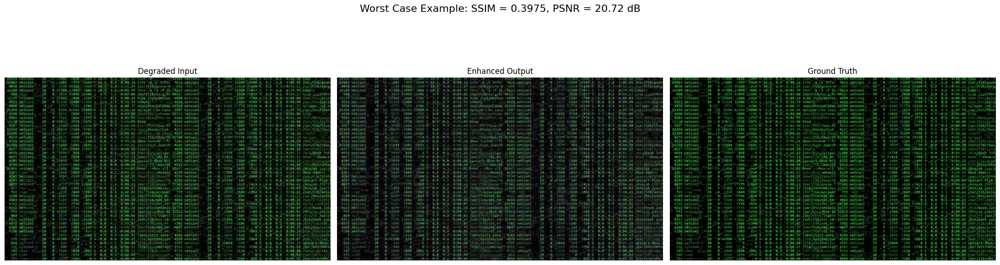

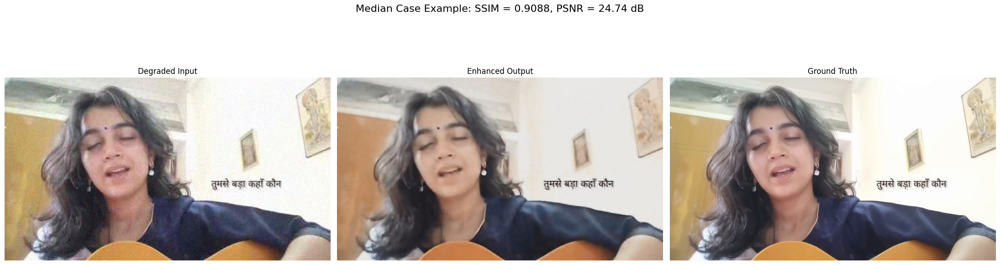

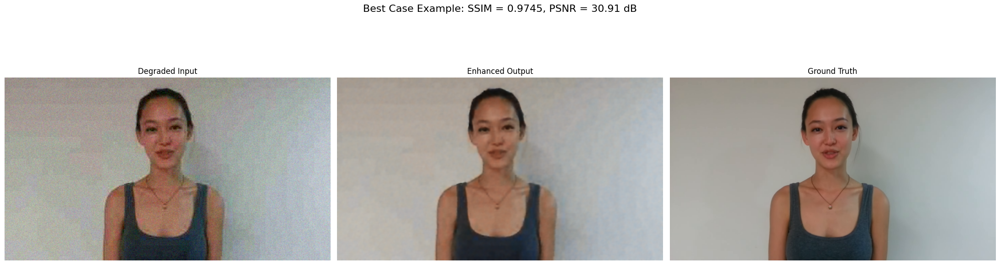


✅ Visual reports saved to '/content/cpu_openvino_benchmark_outputs/'.


In [ ]:
# ==============================================================================
# 3. MAIN EXECUTION BLOCK (CORRECTED TIMER LOGIC)
# ==============================================================================
def main():
    # --- Step 1 & 2: Upload and Load OpenVINO Model ---
    # ... (This part is correct and omitted for brevity) ...
    print("\n--- Step 1: Upload your OpenVINO model .zip file ---")
    uploaded_model_zip = files.upload(); model_extract_path = '/content/openvino_model/'
    if not uploaded_model_zip: return
    with zipfile.ZipFile(io.BytesIO(list(uploaded_model_zip.values())[0]), 'r') as z: z.extractall(model_extract_path)
    OPENVINO_MODEL_PATH = glob(os.path.join(model_extract_path, '*.xml'))[0]
    core = Core(); model_ov = core.read_model(OPENVINO_MODEL_PATH)
    compiled_model = core.compile_model(model_ov, "CPU")
    print("✅ OpenVINO model compiled for CPU and is ready.")

    # --- Step 3: Upload and Find Data ---
    # ... (This part is correct and omitted for brevity) ...
    print("\n--- Step 2: Upload your benchmark dataset .zip (with hr and student_lr) ---")
    uploaded_data_zip = files.upload()
    if not uploaded_data_zip: return
    data_extract_path = '/content/benchmark_data/'
    with zipfile.ZipFile(io.BytesIO(list(uploaded_data_zip.values())[0]), 'r') as z: z.extractall(data_extract_path)
    base_hr_dir = None; base_lr_dir = None
    for root, dirs, _ in os.walk(data_extract_path):
        for d in dirs:
            if d.lower() == 'hr': base_hr_dir = os.path.join(root, d)
            if d.lower() == 'student_lr': base_lr_dir = os.path.join(root, d)
        if base_hr_dir and base_lr_dir: break
    if not base_hr_dir or not base_lr_dir: print("❌ Could not find folders."); return
    lr_image_paths = sorted(glob(os.path.join(base_lr_dir, '**', '*.*'), recursive=True))
    lr_image_paths = [f for f in lr_image_paths if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    print(f"✅ Found {len(lr_image_paths)} images. Starting benchmark...")

    # --- Step 4: Run the Benchmark Loop with DUAL TIMERS ---
    results_data, total_loop_time, total_inference_time = [], 0, 0
    for lr_path in tqdm(lr_image_paths, desc="Benchmarking on CPU with OpenVINO"):
        try:
            # START outer timer
            loop_start_time = time.time()

            hr_path = lr_path.replace(base_lr_dir, base_hr_dir)
            if not os.path.exists(hr_path): continue

            original_pil = Image.open(hr_path).convert("RGB")
            degraded_pil = Image.open(lr_path).convert("RGB")

            # START inner timer
            inference_start_time = time.time()
            enhanced_pil = run_inference_ov(compiled_model, degraded_pil)
            total_inference_time += time.time() - inference_start_time
            # END inner timer

            # Do all other work
            original_np = np.array(original_pil)
            enhanced_np = np.array(enhanced_pil)
            h, w, _ = enhanced_np.shape
            original_cropped_np = original_np[:h, :w, :]
            results_data.append({
                "ssim": ssim(original_cropped_np, enhanced_np, data_range=255, channel_axis=-1, win_size=7),
                "psnr": psnr(original_cropped_np, enhanced_np, data_range=255),
                "original_pil": original_pil, "degraded_pil": degraded_pil, "enhanced_pil": enhanced_pil
            })

            # --- THE FIX IS HERE ---
            # Now, at the very end of the loop, calculate the total loop duration.
            total_loop_time += time.time() - loop_start_time
            # END outer timer

        except Exception as e:
            print(f"Skipping an image due to an error: {e}")

    # --- Step 5: Display the final, detailed report ---
    # (The report generation code from the previous version is correct and does not need to change)
    if results_data:
        avg_model_fps = len(results_data) / total_inference_time if total_inference_time > 0 else 0
        avg_system_fps = len(results_data) / total_loop_time if total_loop_time > 0 else 0
        ssim_scores = [r['ssim'] for r in results_data]; psnr_scores = [r['psnr'] for r in results_data]
        avg_ssim = np.mean(ssim_scores); std_ssim = np.std(ssim_scores)
        avg_psnr = np.mean(psnr_scores); std_psnr = np.std(psnr_scores)

        print("\n" + "="*50)
        print("📊 CPU BENCHMARK (OpenVINO) - FINAL REPORT 📊")
        print("="*50)
        print(f"Average SSIM: {avg_ssim:.4f} (Std Dev: {std_ssim:.4f})")
        print(f"Average PSNR: {avg_psnr:.2f} dB (Std Dev: {std_psnr:.2f})")
        print("-" * 50)
        print("--- Performance Analysis ---")
        print(f"Average Model FPS (Pure Computation): {avg_model_fps:.2f} FPS")
        print(f"Average System Throughput (w/ File I/O): {avg_system_fps:.2f} FPS")
        print("="*50)

        display_graphical_report("CPU BENCHMARK (OpenVINO)", results_data)

# --- Run the main function ---
if __name__ == "__main__":
    main()